# Detction de Cadastre Projet description 

## Satellite Image Processing 

In this notebook, we demonstrate a basic workflow for processing a satellite image using OpenCV. The aim is to detect and enhance features such as roads or structures in the image.

### Grayscale Conversion
First, we convert the satellite image to grayscale. This simplification step reduces the image to a single channel, making further processing steps more efficient.

### Gaussian Blur
Gaussian Blur is applied to smoothen the image. It helps in reducing noise and detail from the image. The Gaussian function is defined as:

$$ G(x, y) = \frac{1}{2\pi\sigma^2}e^{-\frac{x^2 + y^2}{2\sigma^2}} $$

Where $ \sigma $ is the standard deviation of the Gaussian distribution.

### Edge Detection with Canny Algorithm
The Canny Edge Detector is a multi-stage algorithm used to detect a wide range of edges in images. It works by finding the intensity gradients of the image. The gradient magnitude is given by:

$$ G = \sqrt{G_x^2 + G_y^2} $$

Where $ G_x $ and $ G_y $ are the horizontal and vertical derivatives of the image.

### Binary Thresholding
After detecting edges, the image is converted to a binary format (black and white) using thresholding. This is defined by:

$$ f(x) = \left\{\begin{array}{ll}
255 & \text{if } x > T \\
0 & \text{otherwise}
\end{array}\right. $$

Where $ T $ is the threshold value.

### Morphological Operations
Morphological operations like closing are applied to the binary image to close gaps and connect disjoint parts.


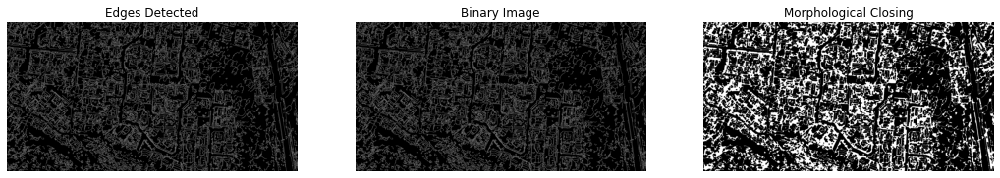

In [7]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the image
file_path = 'data\Satellite_test.png'  
image = cv2.imread(file_path)

# Convert to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian Blur to reduce noise
blurred = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Edge detection using Canny algorithm
edges = cv2.Canny(blurred, 50, 150)

# Apply binary threshold to get a binary image
_, binary_image = cv2.threshold(edges, 50, 255, cv2.THRESH_BINARY)

# Define a kernel for the morphological operations
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))

# Morphological operations to close gaps in the road edges
closed = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)

# Display the processed images
plt.figure(figsize=(18, 9))

plt.subplot(1, 3, 1)
plt.imshow(edges, cmap='gray')
plt.title('Edges Detected')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(closed, cmap='gray')
plt.title('Morphological Closing')
plt.axis('off')

plt.show()


# Image Processing: Feature Matching and Warping
## Overview
This notebook showcases the process of matching features between two distinct types of images—a satellite image and a cadastre (land registry) image. The key steps involve converting images to grayscale, detecting and matching features using the SIFT algorithm, and applying homography to warp the cadastre image to align with the satellite image.

## Process Steps
1. **Grayscale Conversion:** Both the satellite and cadastre images are converted to grayscale to simplify the feature detection process.

2. **SIFT Feature Detection:** The SIFT (Scale-Invariant Feature Transform) algorithm detects key features in both images. SIFT is invariant to image scaling and rotation, and partially invariant to changes in illumination and 3D camera viewpoint.

3. **FLANN-Based Matching:** The Fast Library for Approximate Nearest Neighbors (FLANN) is used for robust and efficient matching of the SIFT features between the two images.

4. **Lowe's Ratio Test:** This test filters out weak matches by comparing the distance of the best match to the distance of the second-best match. Only matches passing this ratio test are retained.

5. **Homography and Warping:** If a sufficient number of matches are found, a homography matrix is computed. This matrix is then used to warp the cadastre image, transforming it to the perspective of the satellite image.

6. **Result Display:** The final step involves visualizing the warped cadastre image superimposed on the satellite image, demonstrating the alignment achieved through feature matching and homography.



Let's implement it for the cadastral image

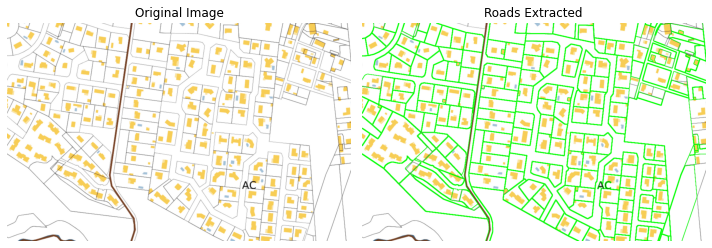

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


img = cv2.imread("data\Cadastre test.png")

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply GaussianBlur
blur = cv2.GaussianBlur(gray, (5, 5), 0)

# Detect edges using Canny
edges = cv2.Canny(blur, 50, 150)

# Dilate the edges
dilated = cv2.dilate(edges, np.ones((2, 2), np.uint8), iterations=1)

# Erode to narrow the edges
eroded = cv2.erode(dilated, np.ones((2, 2), np.uint8), iterations=1)

# Find contours from the edged image
contours, hierarchy = cv2.findContours(eroded, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Filter the contours based on area (this might need to be adjusted)
road_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > 3000]

# Draw the contours on the original image
road_img = np.copy(img)
cv2.drawContours(road_img, road_contours, -1, (0, 255, 0), 2)


# Let's display the original and the road extracted images side by side for comparison
plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(road_img, cv2.COLOR_BGR2RGB))
plt.title('Roads Extracted')
plt.axis('off')

plt.tight_layout()
plt.show()

Same for the satellite images:

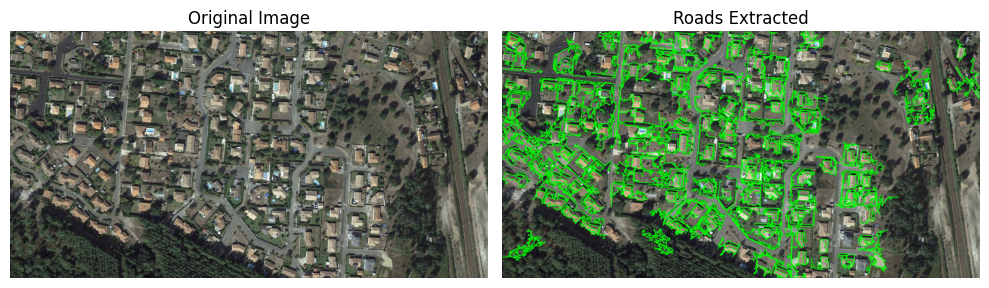

In [33]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image
image_path = 'data\Satellite_test.png'  
img = cv2.imread(image_path)

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply GaussianBlur
blur = cv2.GaussianBlur(gray, (5, 5), 0)

# Detect edges using Canny
edges = cv2.Canny(blur, 50, 150)

# Dilate the edges
dilated = cv2.dilate(edges, np.ones((2, 2), np.uint8), iterations=1)

# Erode to narrow the edges
eroded = cv2.erode(dilated, np.ones((2, 2), np.uint8), iterations=1)

# Find contours from the edged image
contours, hierarchy = cv2.findContours(eroded, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Filter the contours based on area (this might need to be adjusted)
road_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > 1500]

# Draw the contours on the original image
road_img = np.copy(img)
cv2.drawContours(road_img, road_contours, -1, (0, 255, 0), 2)


# Let's display the original and the road extracted images side by side for comparison
plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(road_img, cv2.COLOR_BGR2RGB))
plt.title('Roads Extracted')
plt.axis('off')

plt.tight_layout()
plt.show()



## Matching cadastre

### Advanced Image Processing: Feature Matching and Homography in OpenCV

This notebook showcases a sophisticated technique of aligning a cadastre map to a satellite image using OpenCV's feature matching and homography capabilities.

The following part explore Primarily focused on line detection and matching. The script first reads two images, then employs a series of steps involving grayscale conversion, Gaussian Blur, Canny Edge Detection, and Hough Line Transform to detect lines. It further analyzes these lines for their geometric properties—length, angle, and midpoint—before intelligently matching them between the two images based on these characteristics. The matched lines are visually highlighted, and the results are displayed using Matplotlib. This approach is particularly valuable in fields like remote sensing and cartography, where accurate line matching across images can provide significant insights.

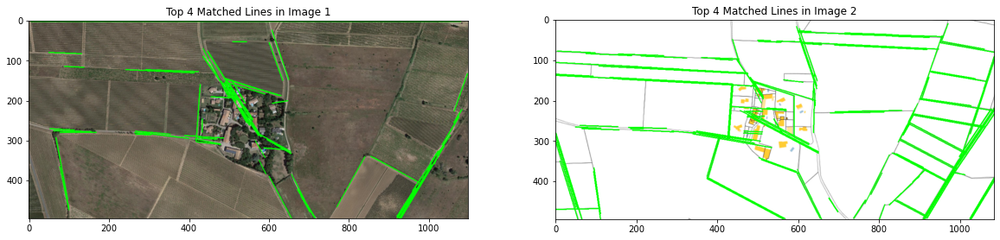

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# Read the image
file_path = 'data\Sattelite test 2.png'  
image1 = cv2.imread(file_path)
image_path = 'data\Cadastre test 2.PNG'
image2 = cv2.imread(image_path)

# Function to detect lines using Hough Transform
def detect_lines(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply GaussianBlur to reduce noise and improve edge detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    # Apply Canny edge detector
    edges = cv2.Canny(blurred, 50, 250, apertureSize=3)
    # Apply Hough Line Transform
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=80, minLineLength=30, maxLineGap=10)
    return lines

# Draw lines detected by Hough Transform
def draw_lines(image, lines):
    line_image = image.copy()
    if lines is not None:
        for line in lines:
            for x1, y1, x2, y2 in line:
                cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    return line_image

# Detect lines in both images
lines1 = detect_lines(image1)
lines2 = detect_lines(image2)

# Draw the lines on the images
image1_with_lines = draw_lines(image1, lines1)
image2_with_lines = draw_lines(image2, lines2)

# Display the images with lines
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(cv2.cvtColor(image1_with_lines, cv2.COLOR_BGR2RGB))
axes[0].set_title('Top 4 Matched Lines in Image 1')
axes[1].imshow(cv2.cvtColor(image2_with_lines, cv2.COLOR_BGR2RGB))
axes[1].set_title('Top 4 Matched Lines in Image 2')
plt.show()
fig.savefig("lines.png")

(628.0, 85.0) (623.5, 107.5)
(83.5, 271.5) (80.5, 266.5)
(628.0, 85.0) (624.0, 85.5)
(423.0, 230.5) (430.0, 227.5)


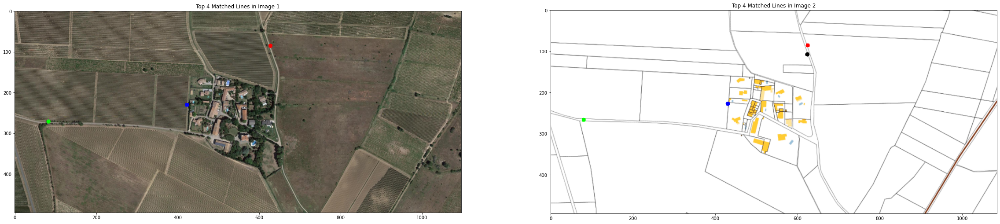

In [11]:


# Function to calculate line length
def line_length(line):
    x1, y1, x2, y2 = line[0]
    return np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

# Function to calculate line angle
def line_angle(line):
    x1, y1, x2, y2 = line[0]
    return np.arctan2(y2 - y1, x2 - x1) * 180 / np.pi


# Function to calculate the midpoint of a line
def midpoint(line):
    x1, y1, x2, y2 = line[0]
    return ((x1 + x2) / 2, (y1 + y2) / 2)

# Modified match_lines function with spatial constraint
def match_lines(lines1, lines2, angle_threshold=10, length_ratio_threshold=0.8, max_midpoint_distance=50):
    matches = []
    for line1 in lines1:
        length1, angle1 = line_length(line1), line_angle(line1)
        mid1 = midpoint(line1)
        for line2 in lines2:
            length2, angle2 = line_length(line2), line_angle(line2)
            mid2 = midpoint(line2)
            length_ratio = min(length1, length2) / max(length1, length2)
            angle_diff = np.abs(angle1 - angle2)
            midpoint_dist = np.sqrt((mid1[0] - mid2[0])**2 + (mid1[1] - mid2[1])**2)

            if angle_diff <= angle_threshold and length_ratio >= length_ratio_threshold and midpoint_dist <= max_midpoint_distance:
                score = (1 - (angle_diff / angle_threshold)) * (length_ratio)
                matches.append((line1, line2, score))

    # Sort matches based on score and return top 4 matches
    matches.sort(key=lambda x: x[2], reverse=True)
    return matches[:4]



# Your existing draw_matched_lines function, modified to handle the new match format
def draw_matched_lines(image1, image2, matched_lines):
    image1_copy = image1.copy()
    image2_copy = image2.copy()
    colors = [(0,0,0),(0,255,0),(0,0,255),(255,0,0)]
    i = 0
    for line1, line2 in matched_lines:
        # Random color for each matched pair
        color = colors[i]
        i += 1
        mid1 = midpoint(line1)

        # Add a white border for visibility
        cv2.circle(image1_copy, (int(mid1[0]), int(mid1[1])), 2, (255, 255, 255), -1)  # White border
        cv2.circle(image1_copy, (int(mid1[0]), int(mid1[1])), 5, color, -1)  # Inner color

        mid2 = midpoint(line2)

        # Add a white border for visibility
        cv2.circle(image2_copy, (int(mid2[0]), int(mid2[1])), 2, (255, 255, 255), -1)  # White border
        cv2.circle(image2_copy, (int(mid2[0]), int(mid2[1])), 5, color, -1)  # Inner color
        print(mid1,mid2)

    return image1_copy, image2_copy



# Detect and match lines, keeping only top 4 matches with spatial constraint
lines1 = detect_lines(image1)
lines2 = detect_lines(image2)
top_matched_lines = match_lines(lines1, lines2)
top_matched_lines = [(lines1, lines2) for lines1,lines2,_ in top_matched_lines]

# Draw and display the matched lines with midpoints
image1_matched, image2_matched = draw_matched_lines(image1, image2, top_matched_lines)

# Display the images with lines
fig, axes = plt.subplots(1, 2, figsize=(40, 20))
axes[0].imshow(cv2.cvtColor(image1_matched, cv2.COLOR_BGR2RGB))
axes[0].set_title('Top 4 Matched Lines in Image 1')
axes[1].imshow(cv2.cvtColor(image2_matched, cv2.COLOR_BGR2RGB))
axes[1].set_title('Top 4 Matched Lines in Image 2')
plt.show()
fig.savefig("pointimage.png")


#### Matching with SIFT

1. **Loading and Preprocessing:**
   - The satellite and cadastre images are first loaded and converted to grayscale to facilitate feature detection.

2. **Feature Detection with SIFT:**
   - The Scale-Invariant Feature Transform (SIFT) algorithm is employed to detect distinctive features in both images. SIFT is particularly adept at handling variations in scale, noise, and illumination.

3. **Feature Matching using FLANN:**
   - The FLANN (Fast Library for Approximate Nearest Neighbors) matcher efficiently pairs features between the two images. It's known for its speed and accuracy in handling large datasets.

4. **Lowe's Ratio Test:**
   - This critical test filters out less reliable matches by comparing the distance of the best match to the second-best match. Only the matches that pass this test are considered good.

5. **Homography Computation:**
   - With enough good matches, a homography matrix is computed. This matrix is a transformation that maps the points from the cadastre image to the satellite image.

6. **Image Warping:**
   - The cadastre image is warped using the computed homography matrix, allowing it to align perfectly with the satellite image.

7. **Visualizing Results:**
   - The final step is the visual representation of this alignment, showcasing how well the features in the cadastre map match up with those in the satellite image.

#### Applications
This methodology is highly applicable in fields like remote sensing, urban planning, and geographic information systems (GIS), where aligning different image types is crucial for analysis and decision-making.


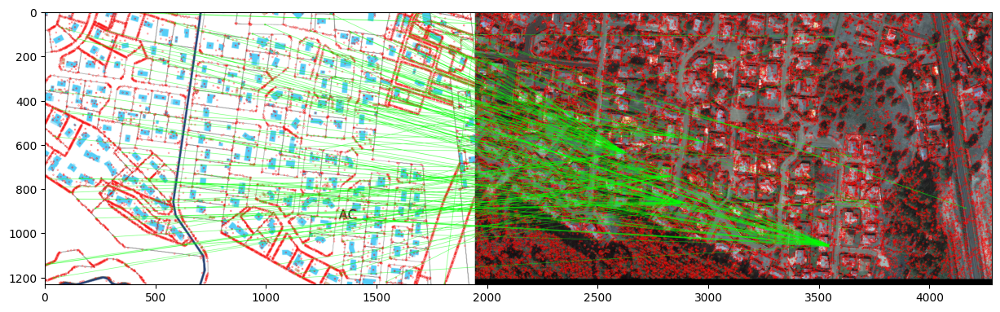

In [22]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Paths to the input images
satellite_image_path = 'data\Satellite_test.png'  
cadastre_image_path = 'data/Cadastre test.png'

# Load the images
satellite_image = cv2.imread(satellite_image_path)
cadastre_image = cv2.imread(cadastre_image_path)

# Convert images to grayscale
satellite_gray = cv2.cvtColor(satellite_image, cv2.COLOR_BGR2GRAY)
cadastre_gray = cv2.cvtColor(cadastre_image, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Find the keypoints and descriptors with SIFT
keypoints_satellite, descriptors_satellite = sift.detectAndCompute(satellite_gray, None)
keypoints_cadastre, descriptors_cadastre = sift.detectAndCompute(cadastre_gray, None)

# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary

flann = cv2.FlannBasedMatcher(index_params,search_params)

matches = flann.knnMatch(descriptors_cadastre, descriptors_satellite, k=2)

# Need to draw only good matches, so create a mask
matchesMask = [[0,0] for i in range(len(matches))]

# Ratio test as per Lowe's paper
for i,(m,n) in enumerate(matches):
    if m.distance < 0.7*n.distance:
        matchesMask[i]=[1,0]

draw_params = dict(matchColor = (0,255,0),
                   singlePointColor = (255,0,0),
                   matchesMask = matchesMask,
                   flags = cv2.DrawMatchesFlags_DEFAULT)

# Draw the matches
img3 = cv2.drawMatchesKnn(cadastre_image, keypoints_cadastre, satellite_image, keypoints_satellite, matches, None, **draw_params)

plt.figure(figsize=(15, 7))
plt.imshow(img3)
plt.show()

# Proceed to compute homography and warp image if we have enough good matches
good_matches = [m for m, mask in zip(matches, matchesMask) if mask[0]]
if len(good_matches) > 4:  # Minimum number of matches to compute homography
    # Extract location of good matches
    points_cadastre = np.float32([keypoints_cadastre[m[0].queryIdx].pt for m in good_matches])
    points_satellite = np.float32([keypoints_satellite[m[0].trainIdx].pt for m in good_matches])

    # Find homography matrix
    H, status = cv2.findHomography(points_cadastre, points_satellite, cv2.RANSAC,5.0)

    # Warp cadastre image to fit satellite image
    height, width, channels = satellite_image.shape
    warped_cadastre = cv2.warpPerspective(cadastre_image, H, (width, height))

    #plt.figure(figsize=(15, 7))
    #plt.imshow(cv2.cvtColor(warped_cadastre, cv2.COLOR_BGR2RGB))
    #plt.title("Warped Cadastre Image")
    #plt.axis('off')
    #plt.show()
else:
    print("Not enough matches are found - {}/{}".format(len(good_matches), 4))

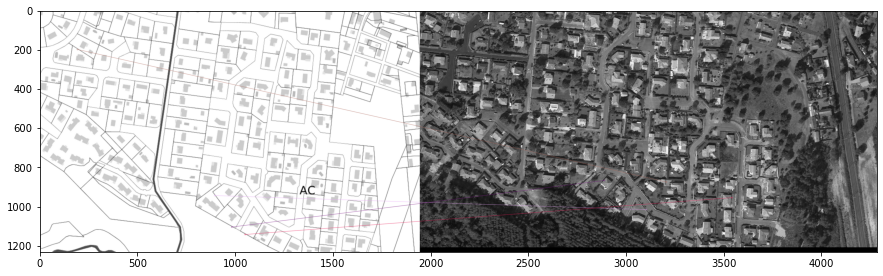

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the images
satellite_path = 'data\Satellite_test.png'  
cadastre_path = 'data/Cadastre test.png'


cadastre_image = cv2.imread(cadastre_path, 0)  # Load in grayscale
satellite_image = cv2.imread(satellite_path, 0)  # Load in grayscale

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect SIFT features in both images
keypoints_cadastre, descriptors_cadastre = sift.detectAndCompute(cadastre_image, None)
keypoints_satellite, descriptors_satellite = sift.detectAndCompute(satellite_image, None)

# Create a Brute Force Matcher object
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

# Match descriptors
matches = bf.match(descriptors_cadastre, descriptors_satellite)

# Sort them in the order of their distance
matches = sorted(matches, key=lambda x: x.distance)

# Draw the top N matches
N_MATCHES = 4
matched_image = cv2.drawMatches(cadastre_image, keypoints_cadastre, satellite_image, keypoints_satellite, matches[:N_MATCHES], None, flags=2)

# Display the matched features
plt.figure(figsize=(15, 8))
plt.imshow(matched_image)
plt.show()


Not enough matches are found - 2/10


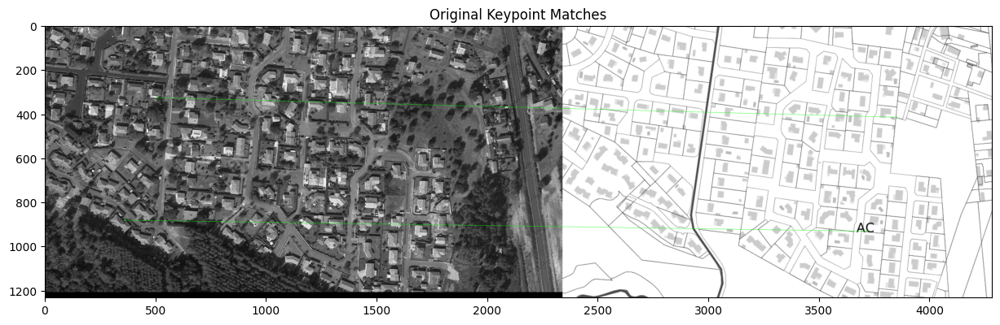

In [24]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the two images
image1_path = 'data\Satellite_test.png'  
image2_path = 'data/Cadastre test.png'

image1 = cv2.imread(image1_path)
image2 = cv2.imread(image2_path)

# Convert images to grayscale
gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# Initialize the ORB detector
orb = cv2.ORB_create()

# Detect keypoints and descriptors
keypoints1, descriptors1 = orb.detectAndCompute(gray1, None)
keypoints2, descriptors2 = orb.detectAndCompute(gray2, None)

# Initialize the matcher
# BFMatcher with default params
matcher = cv2.BFMatcher()
matches = matcher.knnMatch(descriptors1, descriptors2, k=2)

# Apply ratio test
good = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good.append(m)

# Homography if enough matches are found
if len(good) > 10:
    src_pts = np.float32([keypoints1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    # Calculate Homography
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    matchesMask = mask.ravel().tolist()

    # Get the dimensions of the first image
    h, w = gray1.shape
    # Warp the second image to fit the first one
    warp_img = cv2.warpPerspective(image2, M, (w, h))

    # Show the aligned image
    plt.imshow(cv2.cvtColor(warp_img, cv2.COLOR_BGR2RGB))
    plt.title('Aligned Image')
    plt.show()
else:
    matchesMask = None
    print("Not enough matches are found - {}/{}".format(len(good), 10))

# Show original keypoint matches
draw_params = dict(matchColor=(0, 255, 0), # draw matches in green color
                   singlePointColor=None,
                   matchesMask=matchesMask, # draw only inliers
                   flags=2)

img_matches = cv2.drawMatches(gray1, keypoints1, gray2, keypoints2, good, None, **draw_params)

# Show the 
plt.figure(figsize=(15, 8))
plt.imshow(img_matches)
plt.title('Original Keypoint Matches')
plt.show()


## Detect houses and pool 

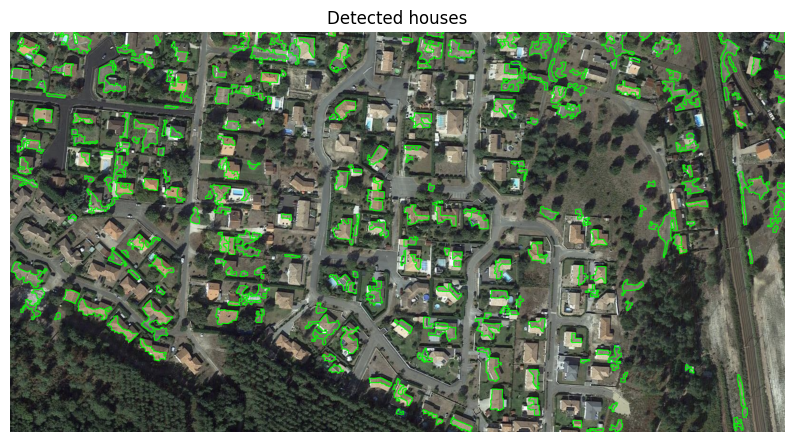

In [38]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the satellite image

image = cv2.imread(satellite_image_path)

# Convert the image to the HSV color space
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define the range for blue color typical for swimming pools
# These ranges can vary, might need tuning for the specific image
lower_blue = np.array([100, 50, 50])
upper_blue = np.array([140, 255, 255])

# Create a mask with the specified blue range
mask = cv2.inRange(image, lower_blue, upper_blue)

# Use morphological operations to clean up the mask
kernel = np.ones((5, 5), np.uint8)
mask_cleaned = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
mask_cleaned = cv2.morphologyEx(mask_cleaned, cv2.MORPH_OPEN, kernel)

# Find contours in the cleaned mask
contours, _ = cv2.findContours(mask_cleaned, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filter contours based on area and shape
pool_contours = []
for contour in contours:
    area = cv2.contourArea(contour)
    if area > 200 and area < 5000:  # Area threshold for pools, may need tuning
        perimeter = cv2.arcLength(contour, True)
        approximation = cv2.approxPolyDP(contour, 0.02 * perimeter, True)
        if len(approximation) >= 4:
            pool_contours.append(contour)

# Draw the contours on the image
image_with_pools = image.copy()
cv2.drawContours(image_with_pools, pool_contours, -1, (0, 255, 0), 2)

# Show the result
plt.figure(figsize=(10, 6))
plt.imshow(cv2.cvtColor(image_with_pools, cv2.COLOR_BGR2RGB))
plt.title('Detected houses')
plt.axis('off')
plt.show()


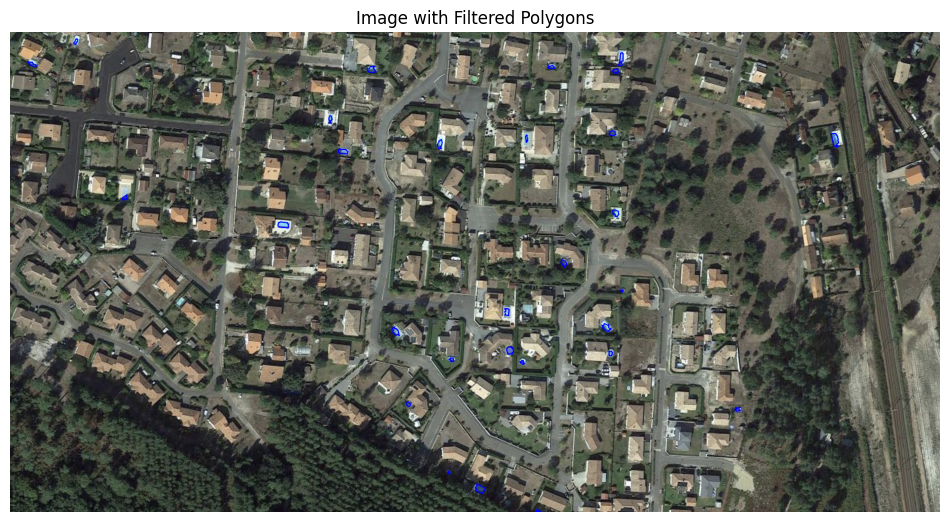

In [39]:
# load image
image = cv2.imread(satellite_image_path)  
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
pools_detection = ColorPoolDetection(image)
pools = pools_detection.filter_and_draw_polygons(show=False)

# draw houses and pools
contour_img = image.copy()
cv2.drawContours(contour_img, pools, -1, (0, 0, 255), 2)

plt.figure(figsize=(12, 12))
plt.imshow(contour_img)
plt.title('Image with Filtered Polygons')
plt.axis('off')
plt.show()

## Pipline match detected pool and cadastre

In [44]:
import folium
import json
from shapely.geometry import shape
# Load the GeoJSON data from a file
with open('cadastre-34130-parcelles.json', 'r') as file:
    geojson_data = json.load(file)

# Use Shapely to calculate the center of the bounding box
multi_polygon = shape(geojson_data['features'][0]['geometry'])
bounds = multi_polygon.bounds  # Returns (minx, miny, maxx, maxy)
center_x = (bounds[0] + bounds[2]) / 2
center_y = (bounds[1] + bounds[3]) / 2
center_point = (center_x, center_y)

center_point = (center_point[1],center_point[0])

In [45]:
import folium
import json
import branca

# Create a white image of 4 pixels, and embed it in a url.
white_tile = branca.utilities.image_to_url([[1, 1], [1, 1]])

# Load the GeoJSON data from a file
with open('cadastre-34130-parcelles.json', 'r') as file:
    geojson_data = json.load(file)

center_point = (43.523563486592614, 3.193477578841215)
# Create a folium map object
m = folium.Map(location=center_point, zoom_start=50, tiles=white_tile,attr="white tile")

# Add the GeoJSON data to the map
folium.GeoJson(geojson_data).add_to(m)

m

In [1]:
from ipyleaflet import Map, basemaps, basemap_to_tiles


center_point = (43.523563486592614, 3.193477578841215)

def create_satellite_view(latitude, longitude, zoom=18):
    satellite_layer = basemap_to_tiles(basemaps.Esri.WorldImagery)

    m = Map(center=(latitude, longitude), zoom=zoom)
    m.add_layer(satellite_layer)


    return m


latitude = center_point[0]
longitude = center_point[1]

# Display the map with satellite view
create_satellite_view(latitude, longitude)

Map(center=[43.523563486592614, 3.193477578841215], controls=(ZoomControl(options=['position', 'zoom_in_text',…

In [2]:
from ipyleaflet import Map, GeoJSON
import json

# Load the GeoJSON data from a file
with open('cadastre-34130-parcelles.json', 'r') as file:
    geojson_data = json.load(file)

center_point = (43.523563486592614, 3.193477578841215)
satellite_layer = basemap_to_tiles(basemaps.Esri.WorldImagery)
# Create an ipyleaflet map object
m = Map(center=center_point, zoom=18)
m.add_layer(satellite_layer)
# Add the GeoJSON data to the map
geo_json_layer = GeoJSON(data=geojson_data)
m.add_layer(geo_json_layer)

# Display the map in the Jupyter Notebook
m

Map(center=[43.523563486592614, 3.193477578841215], controls=(ZoomControl(options=['position', 'zoom_in_text',…

----------------Load cadastre------------
----------------Take a screen------------
----------------Take a screen------------
----------------Detect pools------------


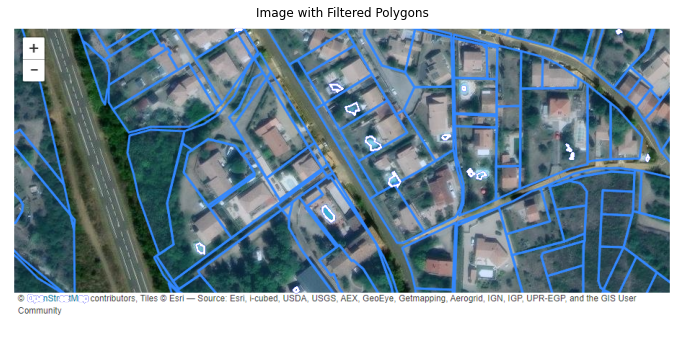

In [3]:
from ipyleaflet import Map, basemaps, basemap_to_tiles
from selenium import webdriver
import time 
from pools_detection import ColorPoolDetection
from PIL import Image
import cv2
import numpy as np
from ipyleaflet import Map, GeoJSON
import json
from matplotlib import pyplot as plt

PATH = "file:///C:/Users/samue/OneDrive/Bureau/Travail/CS/vic/CadastralMap/Final%20Notebook/"


def save_sat_cad(center_point,name):
    # Load the GeoJSON data from a file
    with open('cadastre-34130-parcelles.json', 'r') as file:
        geojson_data = json.load(file)

    satellite_layer = basemap_to_tiles(basemaps.Esri.WorldImagery)
    # Create an ipyleaflet map object
    m = Map(center=center_point, zoom=18)
    m.add_layer(satellite_layer)
    # Add the GeoJSON data to the map
    geo_json_layer = GeoJSON(data=geojson_data)
    m.add_layer(geo_json_layer)

    m.save(f"{name}_with_cad.html")

def crop_image(input_path):
    with Image.open(input_path) as img:
        width, height = img.size
        crop_rectangle = (0, 0, width, height // 2)
        cropped_img = img.crop(crop_rectangle)
        return np.array(cropped_img)


def create_satellite_view(latitude, longitude, zoom=18):
        satellite_layer = basemap_to_tiles(basemaps.Esri.WorldImagery)

        m = Map(center=(latitude, longitude), zoom=zoom)
        m.add_layer(satellite_layer)

        return m

def cadastre_pool(center_point):
    name = "map_screen_test"
    
    latitude = center_point[0]
    longitude = center_point[1]

    # Display the map with satellite view
    m = create_satellite_view(latitude, longitude)
    m.save(f"{name}.html")

    print("----------------Load cadastre------------")
    save_sat_cad(center_point,name)

    driver = webdriver.Chrome()

    # URL of the HTML file
    url1 = f'{PATH}/{name}.html'
    url2 = f'{PATH}/{name}_with_cad.html'
    # Open the URL
    driver.get(url1)
    time.sleep(10)

    print("----------------Take a screen------------")
    # Take screenshot
    driver.save_screenshot("map.png")

    # Open the URL
    driver.get(url2)
    time.sleep(10)


    print("----------------Take a screen------------")
    # Take screenshot
    driver.save_screenshot("cad.png")

    # Close the browser
    driver.quit()
    
    # Example usage
    input_image_path = 'map.png'
    cad_image_path = 'cad.png'

    image = crop_image(input_image_path)
    cad = crop_image(cad_image_path)
    print("----------------Detect pools------------")
    # pools detection 
    pools_detection = ColorPoolDetection(image)
    pools = pools_detection.filter_and_draw_polygons(show=False)

    # draw houses and pools
    contour_img = cad.copy()
    cv2.drawContours(contour_img, pools, -1, (0, 0, 255), 2)
   
    plt.figure(figsize=(12, 12))
    plt.imshow(contour_img)
    plt.title('Image with Filtered Polygons')
    plt.axis('off')
    plt.show()


center_point = (43.5229915797976, 3.1898024073627718)
cadastre_pool(center_point)

Now let's build a Test Set to evaluate our method

----------------Take a screen------------
----------------Detect pools------------


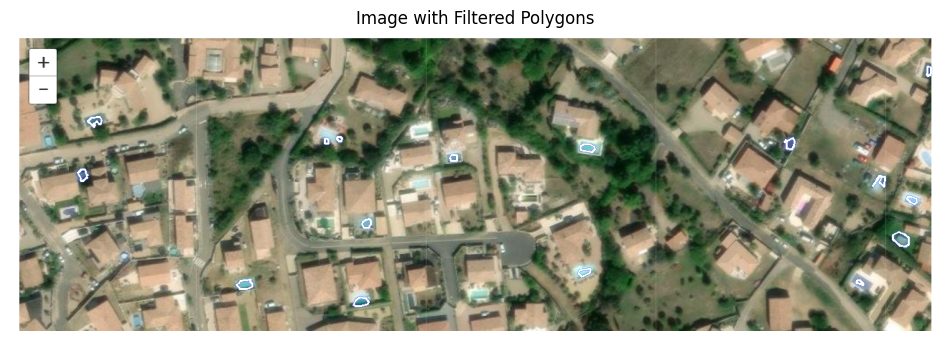

----------------Take a screen------------
----------------Detect pools------------


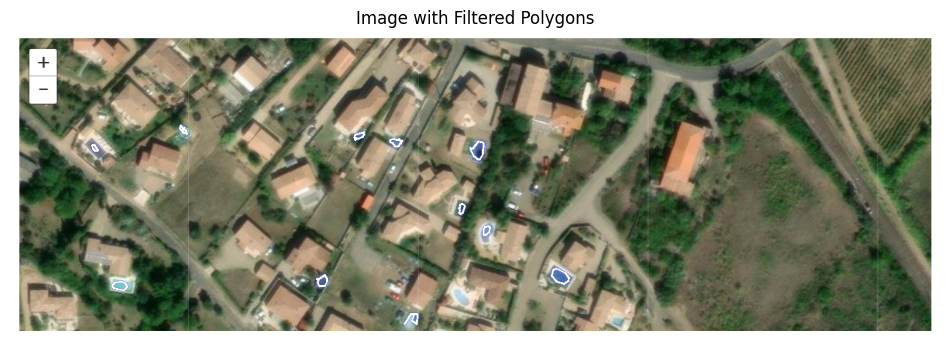

----------------Take a screen------------
----------------Detect pools------------


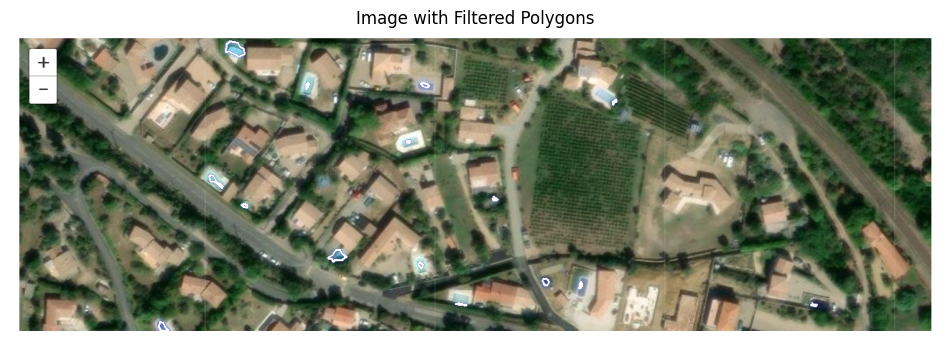

----------------Take a screen------------
----------------Detect pools------------


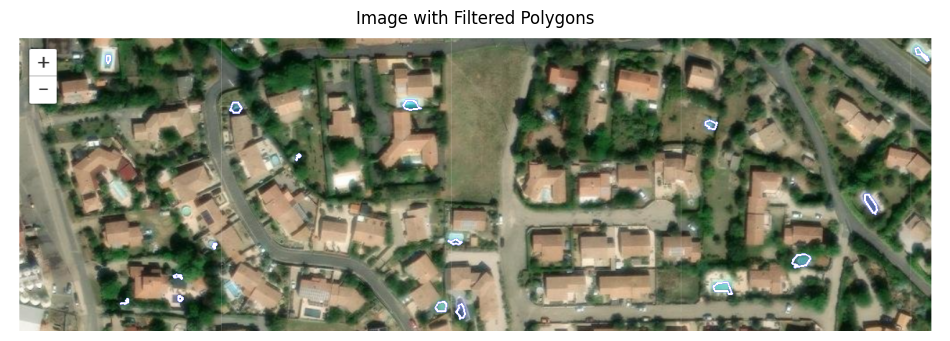

----------------Take a screen------------
----------------Detect pools------------


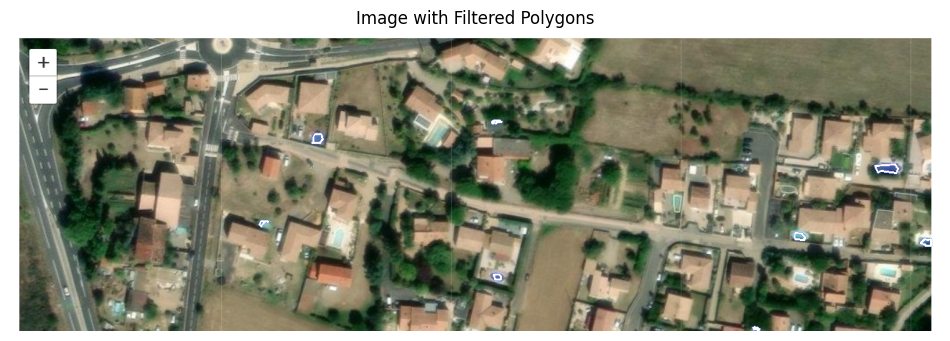

----------------Take a screen------------
----------------Detect pools------------


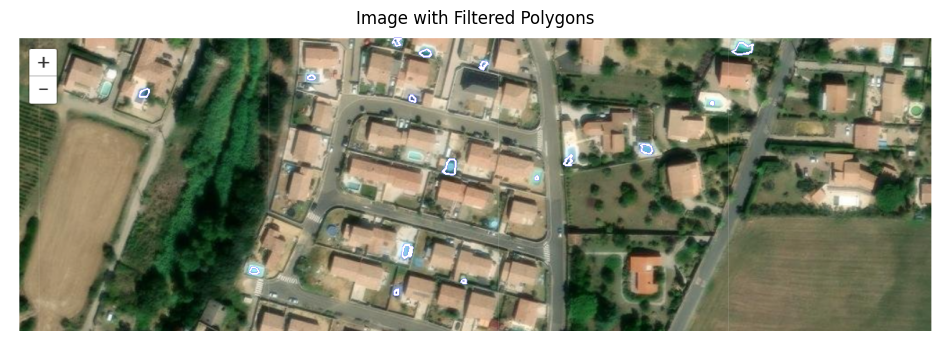

----------------Take a screen------------
----------------Detect pools------------


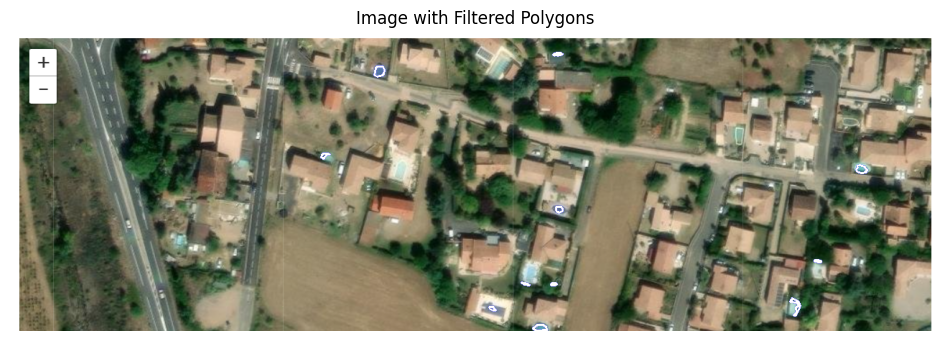

----------------Take a screen------------
----------------Detect pools------------


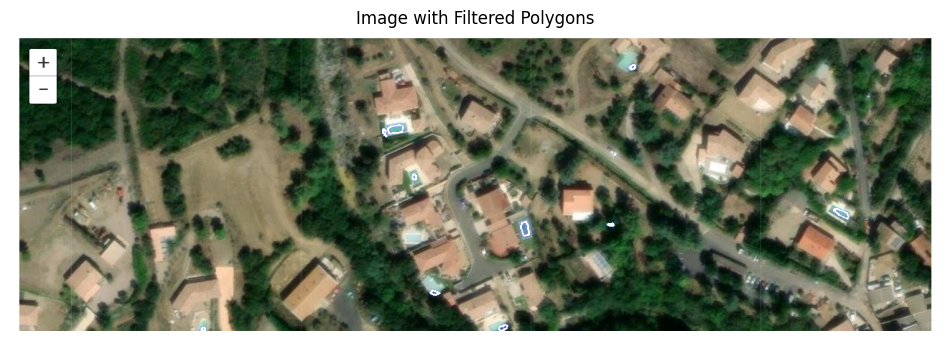

----------------Take a screen------------
----------------Detect pools------------


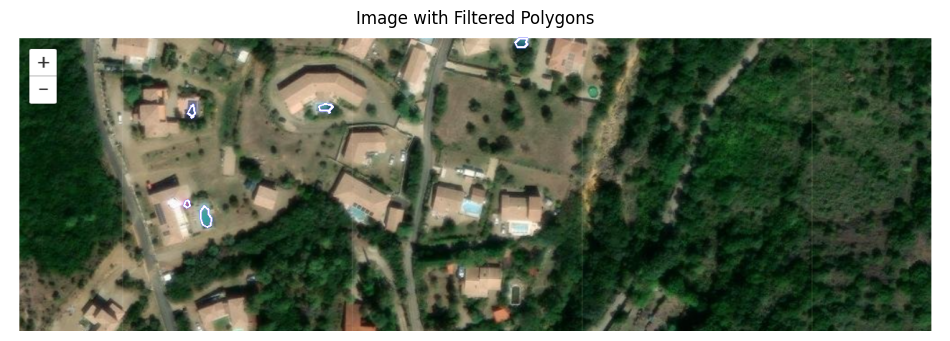

----------------Take a screen------------
----------------Detect pools------------


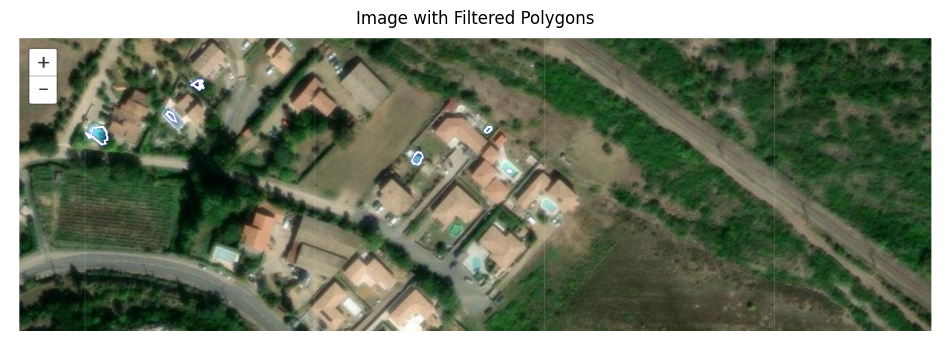

----------------Take a screen------------
----------------Detect pools------------


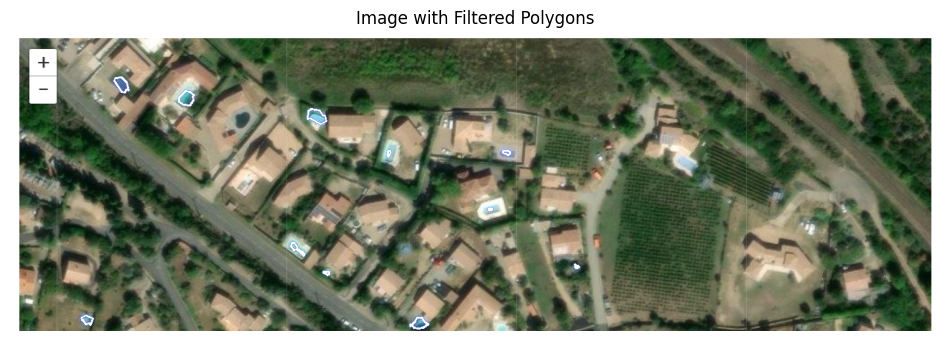

----------------Take a screen------------
----------------Detect pools------------


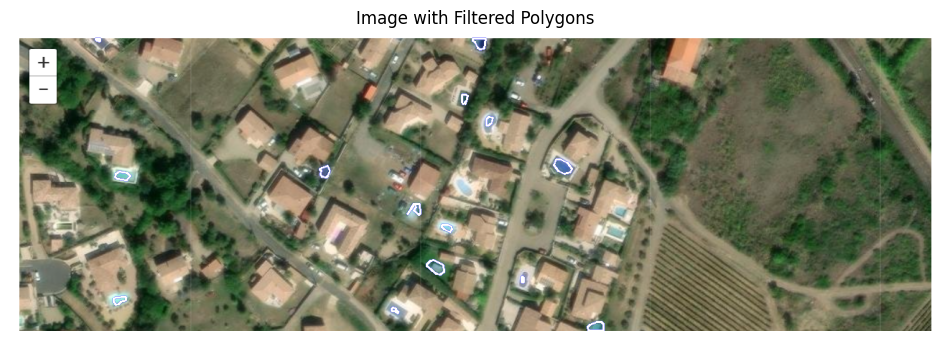

In [58]:
from ipyleaflet import Map, basemaps, basemap_to_tiles
from selenium import webdriver
import time 
from pools_detection import ColorPoolDetection
from PIL import Image
import cv2
import numpy as np
from ipyleaflet import Map, GeoJSON
import json
from matplotlib import pyplot as plt

def save_sat_cad(center_point,name):
    # Load the GeoJSON data from a file
    with open('cadastre-34130-parcelles.json', 'r') as file:
        geojson_data = json.load(file)

    satellite_layer = basemap_to_tiles(basemaps.Esri.WorldImagery)
    # Create an ipyleaflet map object
    m = Map(center=center_point, zoom=18)
    m.add_layer(satellite_layer)
    # Add the GeoJSON data to the map
    geo_json_layer = GeoJSON(data=geojson_data)
    m.add_layer(geo_json_layer)

    m.save(f"{name}_with_cad.html")

def crop_image(input_path):
    with Image.open(input_path) as img:
        width, height = img.size
        crop_rectangle = (0, 0, width, height // 2)
        cropped_img = img.crop(crop_rectangle)
        return np.array(cropped_img)


def create_satellite_view(latitude, longitude, zoom=18):
        satellite_layer = basemap_to_tiles(basemaps.Esri.WorldImagery)

        m = Map(center=(latitude, longitude), zoom=zoom)
        m.add_layer(satellite_layer)

        return m

def cadastre_pool(center_point,i):
    name = f"map_screen_test{i}"
    
    latitude = center_point[0]
    longitude = center_point[1]

    # Display the map with satellite view
    m = create_satellite_view(latitude, longitude)
    m.save(f"{name}.html")


    driver = webdriver.Chrome()

    # URL of the HTML file
    url1 = f'file:///C:/Users/samue/Desktop/Life/CS/VIC/CadastralMap/Test/{name}.html'

    # Open the URL
    driver.get(url1)
    time.sleep(10)

    print("----------------Take a screen------------")
    # Take screenshot
    driver.save_screenshot("map.png")

    # Close the browser
    driver.quit()
    
    # Example usage
    input_image_path = 'map.png'


    image = crop_image(input_image_path)

    print("----------------Detect pools------------")
    # pools detection 
    pools_detection = ColorPoolDetection(image)
    pools = pools_detection.filter_and_draw_polygons(show=False)
    # draw houses and pools
    contour_img = image.copy()
    cv2.drawContours(contour_img, pools, -1, (0, 0, 255), 2)

    # Convert from BGR to RGB
    contour_img_rgb = cv2.cvtColor(contour_img, cv2.COLOR_BGR2RGB)

    # Save the image in RGB format
    cv2.imwrite(f"testset/test{i}.png", contour_img_rgb)

    
    plt.figure(figsize=(12, 12))
    plt.imshow(contour_img)
    plt.title('Image with Filtered Polygons')
    plt.axis('off')
    plt.show()


center_point = [(43.51809421187446, 3.2041844121172236),(43.51868938583265, 3.2069792739083245),(43.520187389651404, 3.2055027879367692),(43.519634022489434, 3.2012849501304226),(43.520350373412924, 3.191670990466292),(43.518207000695114, 3.195506549351456),(43.52005852925941, 3.191300491986094),(43.52515620353287, 3.193940847648991),(43.52686759871949, 3.19775494886302),(43.52172171964068, 3.203473057769498),(43.52047696725812, 3.2050126457328485),(43.51821282540232, 3.2069610415483676)]
for i in range(len(center_point)):
    cadastre_pool(center_point[i],i)